In [1]:
#!unzip /content/drive/MyDrive/mini-project/SorghumWeedDataset_Classification.zip -d /content/drive/MyDrive/mini-project/SorghumWeedDataset


In [2]:
# imp modules to load our dataset

import tensorflow as tf
from tensorflow import keras
from keras import preprocessing
from keras.preprocessing import image_dataset_from_directory

In [3]:
DATASET_PATH =  "/content/drive/MyDrive/mini-project/SorghumWeedDataset/SorghumWeedDataset_Classification"
# Load datasets

train_ds = image_dataset_from_directory(
    DATASET_PATH + '/Train',
    image_size=(128, 128),
    batch_size=32,
    label_mode='int'
)

val_ds = image_dataset_from_directory(
    DATASET_PATH + '/Validate',
    image_size=(128, 128),
    batch_size=32,
    label_mode='int'
)

test_ds = image_dataset_from_directory(
    DATASET_PATH + '/Test',
    image_size=(128, 128),
    batch_size=32,
    label_mode='int'
)

Found 3019 files belonging to 3 classes.
Found 862 files belonging to 3 classes.
Found 431 files belonging to 3 classes.


In [4]:
print("Class names:", train_ds.class_names)


Class names: ['Class0_Sorghum', 'Class1_Grass', 'Class2_BroadLeafWeed']


In [5]:
import matplotlib.pyplot as plt

def show_batch(dataset):
    images, labels = next(iter(dataset))
    plt.figure(figsize=(15, 9))
    for i in range(15):
        ax = plt.subplot(3, 5, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(dataset.class_names[labels[i]])
        plt.axis("off")
    plt.tight_layout()
    plt.show()



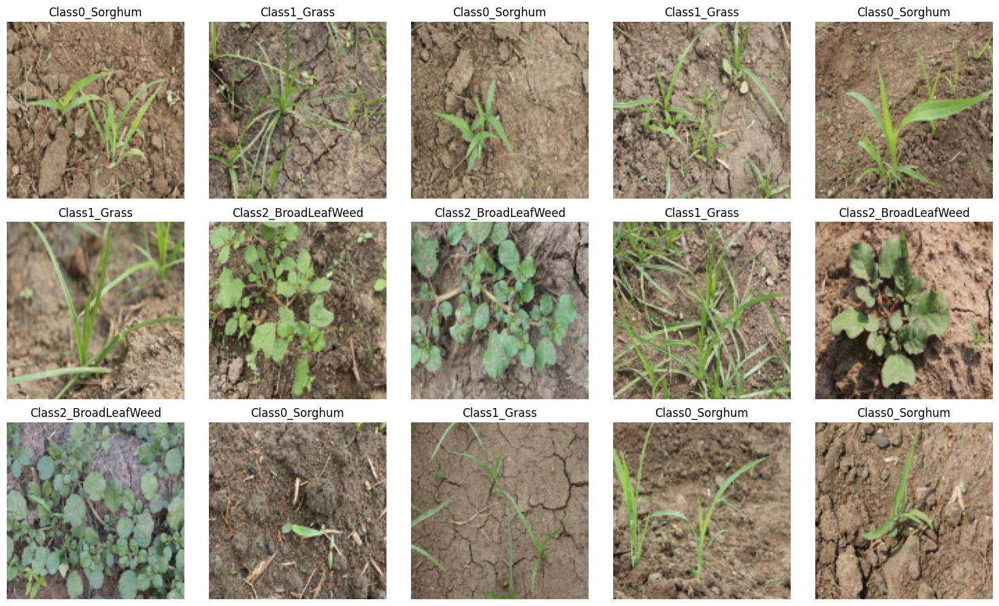

In [6]:
show_batch(train_ds)

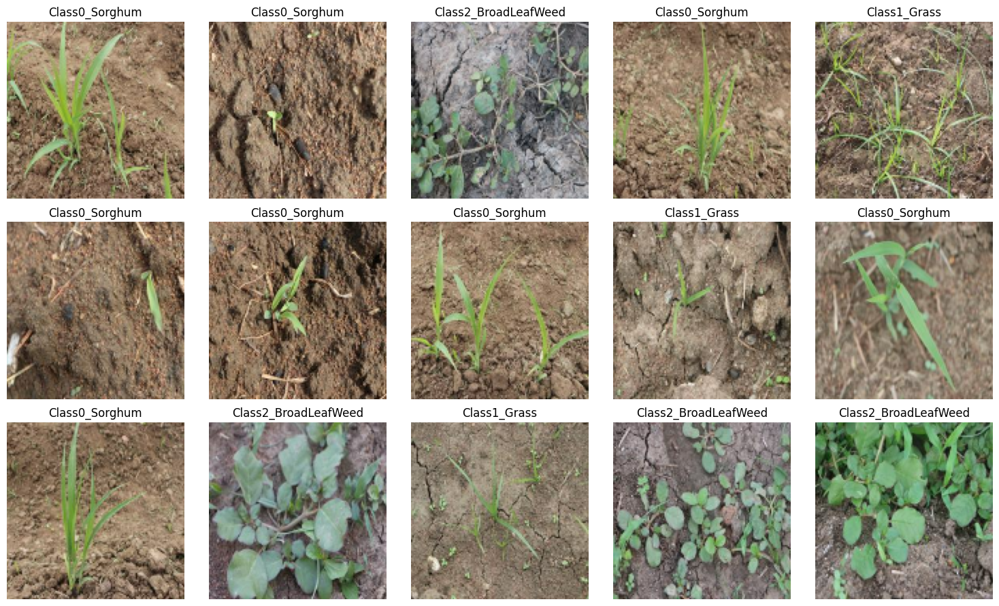

In [7]:
show_batch(val_ds)

In [8]:
# using transfer learing model -->> EfficientNEtB0


base_model = tf.keras.applications.EfficientNetB0(
    input_shape=(128, 128, 3),
    include_top=False,
    weights='imagenet'
)

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [9]:
#base_model.summary()

In [10]:
#from tensorflow.keras.utils import plot_model

# plot_model(
#     base_model,
#     to_file='efficientnetb0.png',
#     show_shapes=True,
#     show_layer_names=True,
#     expand_nested=True,
#     dpi=100
# )

In [11]:
from keras.layers import GlobalAveragePooling2D,Dense,Dropout
from keras import Sequential

In [12]:

base_model.trainable = False



model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(128, activation='relu'),
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(3, activation='softmax')
])



In [13]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb0 (Functional)     │ (None, 4, 4, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,238,502 (16.17 MB)

 Trainable params: 188,931 (738.01 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

In [14]:
from tensorflow.keras.optimizers import Adam

In [15]:
model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)


In [16]:
from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint

In [17]:
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=20,
    callbacks=[
        EarlyStopping(patience=3, restore_best_weights=True),
        ModelCheckpoint('best_model.h5', save_best_only=True)
    ]
)


Epoch 1/20
95/95 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9024 - loss: 0.2916

95/95 ━━━━━━━━━━━━━━━━━━━━ 566s 6s/step - accuracy: 0.9028 - loss: 0.2902 - val_accuracy: 0.9408 - val_loss: 0.1439
Epoch 2/20
94/95 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - accuracy: 0.9817 - loss: 0.0516

95/95 ━━━━━━━━━━━━━━━━━━━━ 13s 135ms/step - accuracy: 0.9816 - loss: 0.0518 - val_accuracy: 0.9524 - val_loss: 0.1201
Epoch 3/20
95/95 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - accuracy: 0.9837 - loss: 0.0448 - val_accuracy: 0.9548 - val_loss: 0.1237
Epoch 4/20
94/95 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - accuracy: 0.9844 - loss: 0.0459

95/95 ━━━━━━━━━━━━━━━━━━━━ 13s 134ms/step - accuracy: 0.9845 - loss: 0.0457 - val_accuracy: 0.9513 - val_loss: 0.1121
Epoch 5/20
94/95 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - accuracy: 0.9862 - loss: 0.0439

95/95 ━━━━━━━━━━━━━━━━━━━━ 13s 137ms/step - accuracy: 0.9863 - loss: 0.0439 - val_accuracy: 0.9594 - val_loss: 0.1044
Epoch 6/20
94/95 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - accuracy: 0.9912 - loss: 0.0233

95/95 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - accuracy: 0.9912 - loss: 0.0234 - val_accuracy: 0.9652 - val_loss: 0.0905
Epoch 7/20
95/95 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - accuracy: 0.9928 - loss: 0.0183 - val_accuracy: 0.9559 - val_loss: 0.1170
Epoch 8/20
95/95 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - accuracy: 0.9902 - loss: 0.0283 - val_accuracy: 0.9466 - val_loss: 0.1243
Epoch 9/20
95/95 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - accuracy: 0.9954 - loss: 0.0165 - val_accuracy: 0.9617 - val_loss: 0.1017


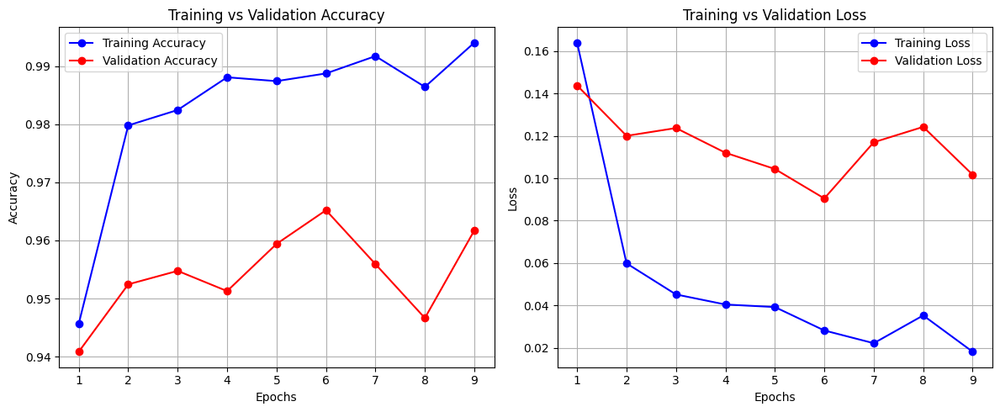

In [18]:
import matplotlib.pyplot as plt

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(acc) + 1)

# Plot Accuracy
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs, acc, 'bo-', label='Training Accuracy')
plt.plot(epochs, val_acc, 'ro-', label='Validation Accuracy')
plt.title('Training vs Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Plot Loss
plt.subplot(1, 2, 2)
plt.plot(epochs, loss, 'bo-', label='Training Loss')
plt.plot(epochs, val_loss, 'ro-', label='Validation Loss')
plt.title('Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


In [19]:
predictions = model.predict(test_ds)


14/14 ━━━━━━━━━━━━━━━━━━━━ 118s 8s/step


In [20]:
predicted_labels = (predictions > 0.5).astype("int32")


In [21]:
import numpy as np
predicted_labels = np.argmax(predictions, axis=1)


In [22]:
true_labels = np.concatenate([y for x, y in test_ds], axis=0)


In [23]:
from sklearn.metrics import classification_report, confusion_matrix

print(confusion_matrix(true_labels, predicted_labels))
print(classification_report(true_labels, predicted_labels))


[[48 45 47]
 [62 37 48]
 [41 54 49]]
              precision    recall  f1-score   support

           0       0.32      0.34      0.33       140
           1       0.27      0.25      0.26       147
           2       0.34      0.34      0.34       144

    accuracy                           0.31       431
   macro avg       0.31      0.31      0.31       431
weighted avg       0.31      0.31      0.31       431



ValueError: num must be an integer with 1 <= num <= 9, not 10

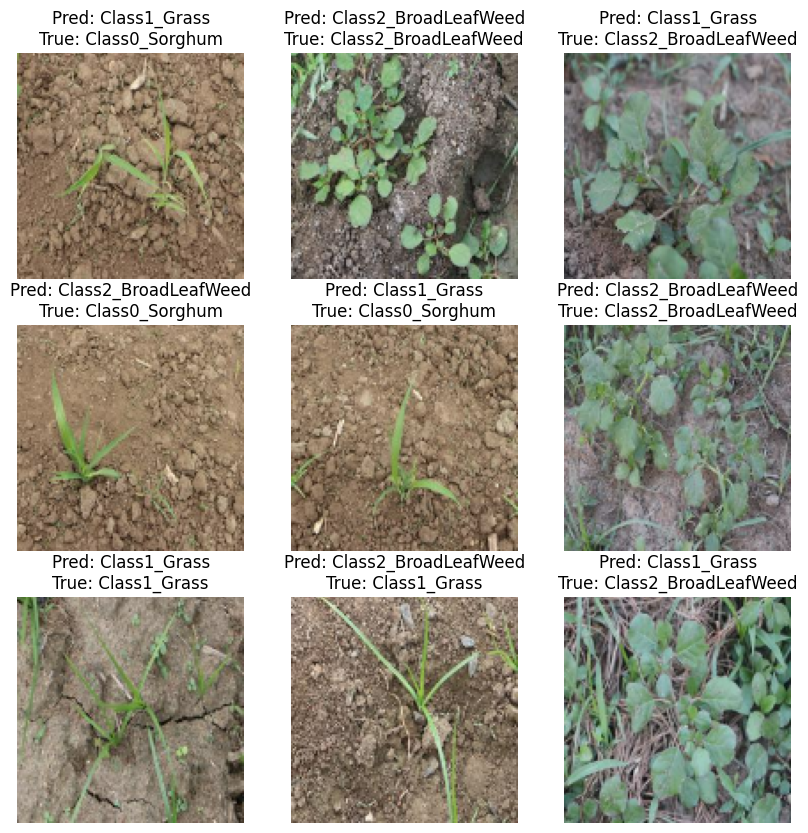

In [27]:
import matplotlib.pyplot as plt

class_names = test_ds.class_names

plt.figure(figsize=(10, 10))
for images, labels in test_ds.take(1):
    for i in range(15):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        pred_label = predicted_labels[i]
        true_label = labels[i].numpy()
        plt.title(f"Pred: {class_names[pred_label]}\nTrue: {class_names[true_label]}")
        plt.axis("off")
plt.tight_layout()
plt.show()

In [31]:
import pandas as pd
import numpy as np

# Initialize lists to store results
predicted_labels = []
actual_labels = []

# Loop through each batch in test_ds
for images, labels in test_ds:
    preds = model.predict(images)  # batch prediction

    # Convert predictions to class labels
    if preds.shape[1] == 1:  # Binary classification
        batch_preds = (preds > 0.5).astype("int32").flatten()
    else:  # Multi-class classification
        batch_preds = np.argmax(preds, axis=1)

    predicted_labels.extend(batch_preds)
    actual_labels.extend(labels.numpy())

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step


In [32]:
df_results = pd.DataFrame({
    'prediction': predicted_labels,
    'actual_result': actual_labels
})

print(df_results.head())


   prediction  actual_result
0           0              0
1           2              2
2           1              1
3           1              1
4           1              1


In [33]:
class_names = test_ds.class_names

df_results['prediction'] = df_results['prediction'].apply(lambda x: class_names[x])
df_results['actual_result'] = df_results['actual_result'].apply(lambda x: class_names[x])

In [34]:
df_results.sample(20)

,prediction,actual_result
73,Class1_Grass,Class1_Grass
295,Class2_BroadLeafWeed,Class2_BroadLeafWeed
202,Class0_Sorghum,Class0_Sorghum
388,Class2_BroadLeafWeed,Class2_BroadLeafWeed
47,Class0_Sorghum,Class0_Sorghum
347,Class0_Sorghum,Class0_Sorghum
242,Class0_Sorghum,Class0_Sorghum
250,Class1_Grass,Class1_Grass
177,Class0_Sorghum,Class0_Sorghum
264,Class0_Sorghum,Class0_Sorghum


from matplotlib import pyplot as plt
import seaborn as sns
_df_0.groupby('prediction').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_1.groupby('actual_result').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['actual_result'].value_counts()
    for x_label, grp in _df_2.groupby('prediction')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('prediction')
_ = plt.ylabel('actual_result')

In [35]:
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(actual_labels, predicted_labels)
print(f"Prediction Accuracy: {accuracy:.4f}")


Prediction Accuracy: 0.9698


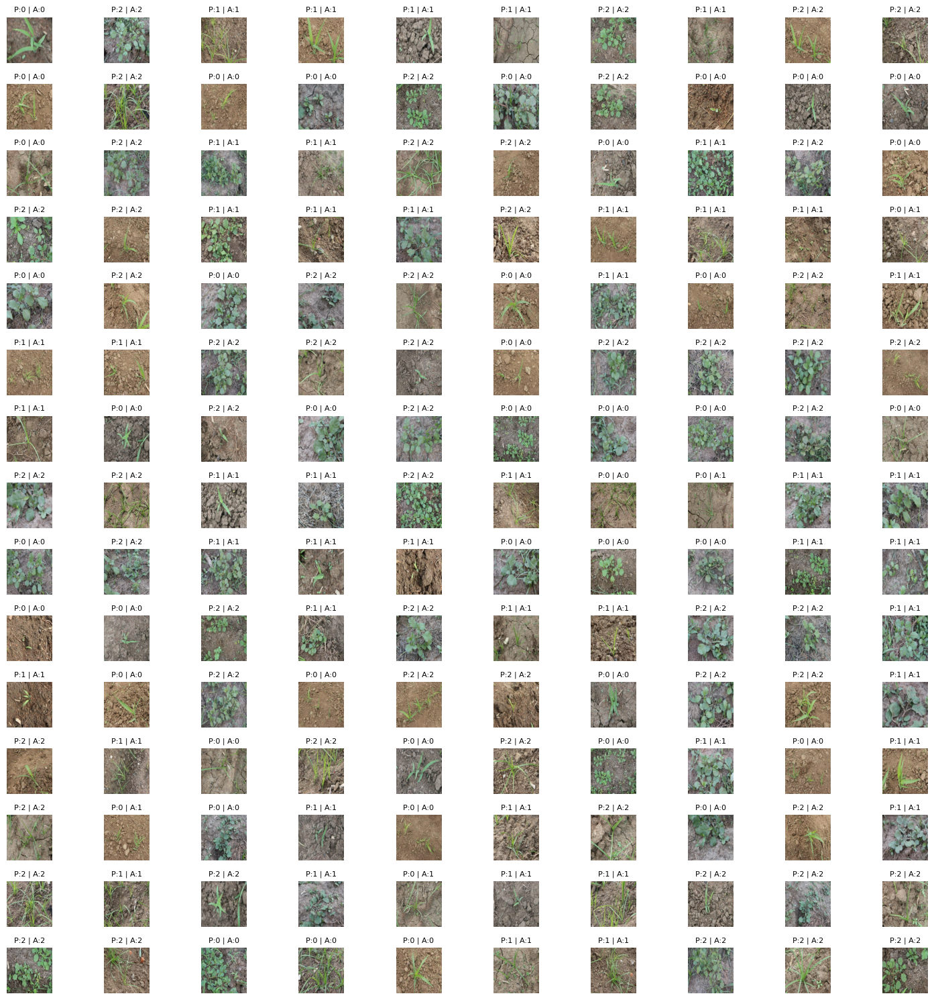

In [36]:
import matplotlib.pyplot as plt

# Make sure predicted_labels and actual_labels are already computed
# class_names = test_ds.class_names  # if you want readable labels

num_images_to_show = 150
shown = 0
figsize = (15, 15)  # Adjust as needed

plt.figure(figsize=figsize)

for images, labels in test_ds:
    batch_size = images.shape[0]
    for i in range(batch_size):
        if shown >= num_images_to_show:
            break

        ax = plt.subplot(15, 10, shown + 1)  # 15 rows × 10 columns = 150
        plt.imshow(images[i].numpy().astype("uint8"))

        pred = predicted_labels[shown]
        actual = actual_labels[shown]

        # If using class names
        # pred_label = class_names[pred]
        # actual_label = class_names[actual]

        plt.title(f"P:{pred} | A:{actual}", fontsize=8)
        plt.axis("off")
        shown += 1

    if shown >= num_images_to_show:
        break

plt.tight_layout()
plt.show()


In [37]:
from tensorflow.keras.models import load_model

# Replace with your actual model path
best_model = load_model('/content/drive/MyDrive/mini-project/models/best_model.h5')


In [38]:
# Initialize lists to store results
predicted_labels = []
actual_labels = []

# Loop through each batch in test_ds
for images, labels in test_ds:
    preds = best_model.predict(images)  # batch prediction

    # Convert predictions to class labels
    if preds.shape[1] == 1:  # Binary classification
        batch_preds = (preds > 0.5).astype("int32").flatten()
    else:  # Multi-class classification
        batch_preds = np.argmax(preds, axis=1)

    predicted_labels.extend(batch_preds)
    actual_labels.extend(labels.numpy())

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step


In [39]:
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(actual_labels, predicted_labels)
print(f"Prediction Accuracy: {accuracy:.4f}")

Prediction Accuracy: 0.8538


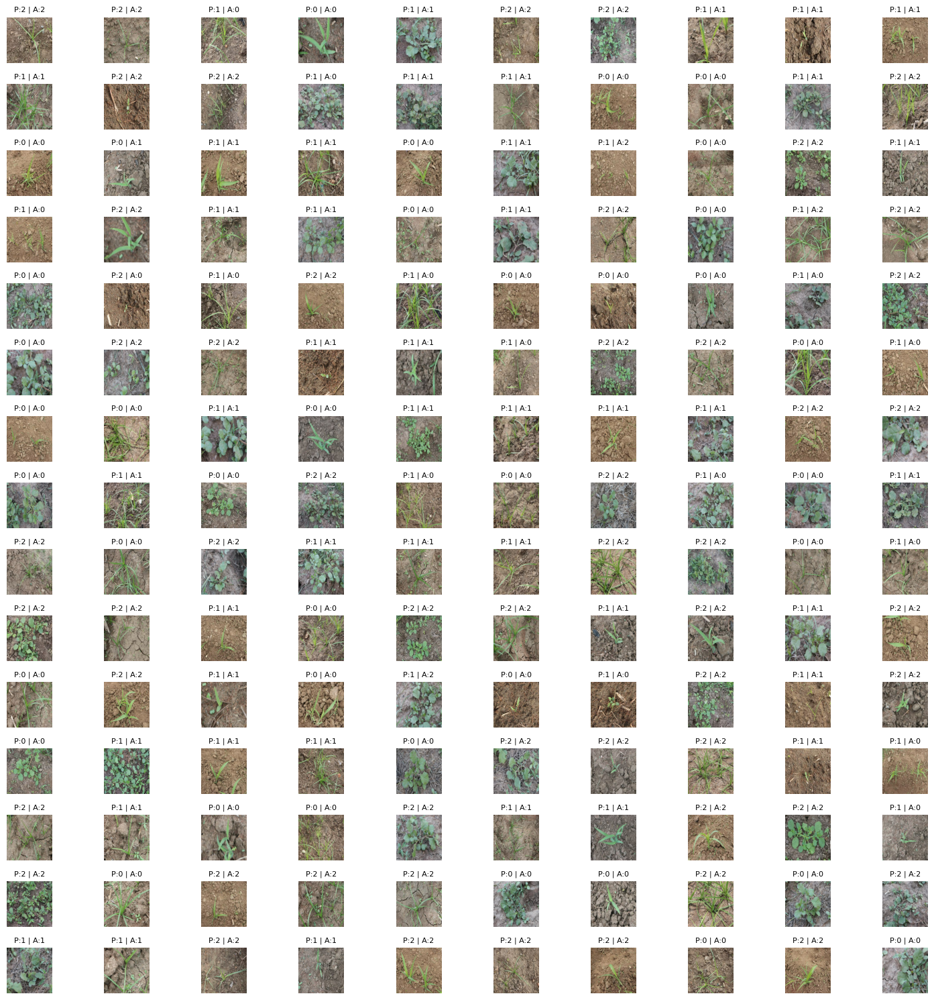

In [40]:
num_images_to_show = 150
shown = 0
figsize = (15, 15)  # Adjust as needed

plt.figure(figsize=figsize)

for images, labels in test_ds:
    batch_size = images.shape[0]
    for i in range(batch_size):
        if shown >= num_images_to_show:
            break

        ax = plt.subplot(15, 10, shown + 1)  # 15 rows × 10 columns = 150
        plt.imshow(images[i].numpy().astype("uint8"))

        pred = predicted_labels[shown]
        actual = actual_labels[shown]

        # If using class names
        # pred_label = class_names[pred]
        # actual_label = class_names[actual]

        plt.title(f"P:{pred} | A:{actual}", fontsize=8)
        plt.axis("off")
        shown += 1

    if shown >= num_images_to_show:
        break

plt.tight_layout()
plt.show()